# Helsinky City Bikes
#### This project was done for the course : Advanced marketing - network analysis (Reichmann University Herzliya)

What are Helsinki City Bikes?

Helsinki City Bikes (HCB) are shared bicycles available to the public in Helsinki and Espoo metropolitan areas, also known as Greater Helsinki. The city bikes were introduced in 2016 as a pilot project with only 46 bike stations available in Helsinki. After becoming popular among the citizens, Helsinki city decided to gradually expand the bike network. In the period between 2017 and 2019, approximately one hundred stations were being added to the network each year. 
By 2019 the bike network reached its complete state with only 7 stations being added in 2020. As of 2020, there were 3,500+ bikes and 350 stations operating in Helsinki and Espoo.
To use the city bikes, citizens purchase access for a day, week or the entire cycling season that lasts from April to November. All passes include an unlimited number of 30-minute bike rides. For an extra fee of 1€/hour, you can use the bike for longer. Bikes are picked up and returned to stations that are located all around Helsinki and Espoo. Citizens can also use their HSL Transport Cards (which works like London’s Oyster Card or the Israeli Rav-Kav).
If the User uses a city bike for more than 30 minutes at a time, an extra fee €1/hour, shall be charged to the User as per the price list. Once a city bike has been successfully returned to a bike station, the User can start a new city bike ride under the same terms. The 30-minute ride time with no extra fee also starts anew.
If a city bike is not successfully returned to a bike station within hours from picking up the bike, the User may be charged an €80 delay fee. If a city bike is not returned to a bike station or to the Service Provider within 24 hours from picking up the bike, the city bike shall be considered as lost.
### Project Leading Questions:
We’ve entered the project with multiple leading questions, we wanted to research a transportation network and see what we can learn from it, and whether we can learn information that could help them make decisions.
The leading questions for our project are:
- How does the average trip look like?
- What can we tell about intended paid trips?
- What is the most common route?
- Which stations are popular?
- Do the most used stations vary yearly?
- What are the main areas of the service?



#### In order to succesfully run the interactive map (mapPlot()) you need to trust this notebook.
This can be done via the File menu. 


In [1]:

# Setting the enviroment
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline
# import os
# import glob
# import sklearn
# import dfply
from collections import Counter
# from scipy import stats
import time
from operator import itemgetter
import folium

In [2]:
#### Final Version - no need anymore to load/install dfply 
# If 'dfply' is not installed please run this chunk (with pip install dfply uncommented)
# !pip install dfply

In [3]:
# Loading the file
# The df can be downloaded from:
# https://www.kaggle.com/geometrein/helsinki-city-bikes/download

# there's also a google drive link here:
# https://drive.google.com/drive/folders/1plaroBDMf1TJIHVokux6ZzhRBVPDP5V-
# please extract the df and change the working directory if needed

path = 'database.csv'


##### Due to the size of our data (over 2GB), reading the csv takes a lot of time. It is possible to shorten the reading time by changing the 'low_memory' option to 'True' however it is unrecommended as it causes problems with parts of the code.

In [4]:
start = time.time()

db = pd.read_csv(path, low_memory=False)

end = time.time()
print ("Time elapsed %.2f seconds." % (end - start)) # Prints how much time it took to read the data

db.head()

Time elapsed 109.15 seconds.


,departure,return,departure_id,departure_name,return_id,return_name,distance (m),duration (sec.),avg_speed (km/h),departure_latitude,departure_longitude,return_latitude,return_longitude,Air temperature (degC)
0,2020-03-23 06:09:44,2020-03-23 06:16:26,86,Kuusitie,111.0,Esterinportti,1747.0,401.0,0.261397,60.195245,24.901900,60.197572,24.926781,0.9
1,2020-03-23 06:11:58,2020-03-23 06:26:31,26,Kamppi (M),10.0,Kasarmitori,1447.0,869.0,0.099908,60.168610,24.930537,60.165017,24.949473,0.9
2,2020-03-23 06:16:29,2020-03-23 06:24:23,268,Porolahden koulu,254.0,Agnetankuja,1772.0,469.0,0.226695,60.195540,25.053581,60.187234,25.036412,0.9
3,2020-03-23 06:33:53,2020-03-23 07:14:03,751,Vallipolku,106.0,Korppaanmäentie,7456.0,2406.0,0.185935,60.227827,24.819614,60.203474,24.898930,0.9
4,2020-03-23 06:36:09,2020-03-23 07:04:10,62,Länsisatamankatu,121.0,Vilhonvuorenkatu,7120.0,1679.0,0.254437,60.158928,24.909692,60.186463,24.967872,0.9


In [5]:
print(db.columns, '\n')

db.shape

Index(['departure', 'return', 'departure_id', 'departure_name', 'return_id',
       'return_name', 'distance (m)', 'duration (sec.)', 'avg_speed (km/h)',
       'departure_latitude', 'departure_longitude', 'return_latitude',
       'return_longitude', 'Air temperature (degC)'],
      dtype='object') 



(12157458, 14)

##### We can see our df is composed of 12,157,457 trips, for each trip several features are known, including trip length, duration and departure and return stations.

In [6]:
print('The number of unique departure stations is',len(Counter(db.departure_name).values())) # Counts the number of unique values
print('The number of unique return stations is',len(Counter(db.return_name).values()))

The number of unique departure stations is 347
The number of unique return stations is 348


In [7]:
# Counter(db.return_name) # Shows the number of times a trip ended for each station.

##### We've discovered 'return_id' and 'departure_id' are non unique identifiers, we will therefore assume these IDs refer to the station the bikes where taken from and returned to.

In [8]:
# Adding a row id (so each trip will have a unique id)
db['id'] = np.arange(len(db))
cols = db.columns.tolist()
cols = cols[-1:] + cols[:-1] # move 'id' to 1st column
db = db[cols]

In [9]:
db.dtypes

id                          int32
departure                  object
return                     object
departure_id               object
departure_name             object
return_id                  object
return_name                object
distance (m)              float64
duration (sec.)           float64
avg_speed (km/h)          float64
departure_latitude        float64
departure_longitude       float64
return_latitude           float64
return_longitude          float64
Air temperature (degC)    float64
dtype: object

In [10]:
## Handling dates and renaming columns:

# Converting type 'object' to 'datetime64':
db[['departure','return']] =  db[['departure','return']].apply(pd.to_datetime, format='%Y-%m-%d %H:%M:%S.%f')

abb_col_names = {
    'distance (m)': 'distance',
    'duration (sec.)': 'duration',
    'avg_speed (km/h)': 'avg_speed',
    'Air temperature (degC)': 'temperature'
}
db.rename(columns=abb_col_names, inplace=True)

In [11]:
db.dtypes

id                              int32
departure              datetime64[ns]
return                 datetime64[ns]
departure_id                   object
departure_name                 object
return_id                      object
return_name                    object
distance                      float64
duration                      float64
avg_speed                     float64
departure_latitude            float64
departure_longitude           float64
return_latitude               float64
return_longitude              float64
temperature                   float64
dtype: object

In [12]:
#CHECKING FOR NA's
pd.DataFrame(db.isna().sum())

,0
id,0
departure,0
return,0
departure_id,0
departure_name,0
return_id,0
return_name,0
distance,0
duration,0
avg_speed,3550


In [13]:
pct_nas = ((15902+3550+1+1)/12157458)*100
print("By dropping all rows containing NAs we will lose at most %.2f%% of our data, which seems acceptable to us" % pct_nas)


By dropping all rows containing NAs we will lose at most 0.16% of our data, which seems acceptable to us


In [14]:
# Remove na's
# Since we have some nas we want to delete them to avoid problems when building our network 
db.dropna(inplace=True)

# Checking that dropping the NAS worked 
pd.DataFrame(db.isna().sum())

,0
id,0
departure,0
return,0
departure_id,0
departure_name,0
return_id,0
return_name,0
distance,0
duration,0
avg_speed,0


In [15]:
db.dtypes

id                              int32
departure              datetime64[ns]
return                 datetime64[ns]
departure_id                   object
departure_name                 object
return_id                      object
return_name                    object
distance                      float64
duration                      float64
avg_speed                     float64
departure_latitude            float64
departure_longitude           float64
return_latitude               float64
return_longitude              float64
temperature                   float64
dtype: object

In [16]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
db[['distance', 'duration', 'avg_speed', 'temperature']].describe()

,distance,duration,avg_speed,temperature
count,12138008.00,12138008.00,12138008.00,12138008.00
mean,2296.18,960.19,0.34,15.65
std,24540.20,7351.54,34.30,5.50
min,-4292467.00,1.00,-468.90,-5.20
25%,1000.00,344.00,0.15,12.30
50%,1739.00,586.00,0.19,16.40
75%,2869.00,971.00,0.22,19.30
max,3681399.00,5401659.00,16991.04,32.90


We can see some of our data still needs handling. We used the info available publicly to address some of our issues:
https://www.hsl.fi/en/citybikes/helsinki

According to the rules user is needed to "Return the bike to a bike station within five hours to avoid the €80 delay fee."
therefor a good reference for maximal duration will be 5 hours (5*60^2 = 18000 seconds).
We will also consider the minimal use to be at least 2.5 minutes (150 seconds) for obvious reasons.
We will consider at a later stage to include more outliers.

As for the distance - there is no reference to the minimal distance between stations, however in the section of the FAQ where asked about the return station being full it says the bike can also be returned in the station's area (10-20 meters) therefor we will look at a minimal distance of 20m.

As for speed - as speed is obviously a function of distance and duration we will handle it if needed after handling the outliers mentioned above.

As for the air temprature - we don't see any problem with the min and max value.

In [17]:
# 30 km/h is a very high speed in a city, let's assume a professional would be able to maintain for the entire 5 hours such a high speed: 30*5*1000 = 150000
# therefor the maximum distance we'll set is 150km or 150,000 meters.

db[(20 < db['distance']) & (db['distance'] < 150000) &
        (150 < db['duration']) & (db['duration'] <  18000)][['distance', 'duration', 'avg_speed', 'temperature']].describe()

,distance,duration,avg_speed,temperature
count,11197154.00,11197154.00,11197154.00,11197154.00
mean,2298.86,809.19,0.19,15.65
std,1654.72,889.79,0.06,5.49
min,21.00,151.00,0.00,-5.20
25%,1142.00,388.00,0.16,12.30
50%,1872.00,623.00,0.19,16.40
75%,2998.00,1002.00,0.22,19.30
max,147089.00,17999.00,31.77,32.90


In [18]:
# We've decided to try other upper limits to 'distance' and by setting the upper limit to 100km instead of 150km 
# we lost "only" 5 trips, which lets us know we can keep the limit at 100km and only lose outliers.

df = db[(20 < db['distance']) & (db['distance'] < 100000) &
        (150 < db['duration']) & (db['duration'] <  18000)]

df[['distance', 'duration', 'avg_speed', 'temperature']].describe()


,distance,duration,avg_speed,temperature
count,11197149.00,11197149.00,11197149.00,11197149.00
mean,2298.81,809.19,0.19,15.65
std,1652.44,889.77,0.06,5.49
min,21.00,151.00,0.00,-5.20
25%,1142.00,388.00,0.16,12.30
50%,1872.00,623.00,0.19,16.40
75%,2998.00,1002.00,0.22,19.30
max,99533.00,17999.00,31.77,32.90


In [19]:
## We'll drop the trip where speed was over 30km/h as it is over the speed of a professional, 
## however we do want to keep longer trips where the bikes where maybe used for sport to so we'll set the limit at 15 km/h

df = df[15>df['avg_speed']]
df[['distance', 'duration', 'avg_speed']].describe()


,distance,duration,avg_speed
count,11197148.00,11197148.00,11197148.00
mean,2298.80,809.19,0.19
std,1652.19,889.77,0.06
min,21.00,151.00,0.00
25%,1142.00,388.00,0.16
50%,1872.00,623.00,0.19
75%,2998.00,1002.00,0.22
max,97833.33,17999.00,14.37


In [20]:
#### We saved the df at this point in order to check it with other platforms i.e., Gephi - however it is unnecessary for you
# ## So we commented this part out.

# import time

# start = time.time()

# df.to_csv("smaller_nw.csv", index=False)

# end = time.time()
# print ("Time elapsed:", end - start)

In [21]:
# int(18000/60/60) # making sure 18000secs=5 hours, can be ignored

In [22]:
df.shape

(11197148, 15)

In [23]:
print("We can see at this point our df has 11,197,148 trips")

We can see at this point our df has 11,197,148 trips


In [24]:
# Create 'year' columns
departure = pd.to_datetime(df.loc[:, 'departure'])
df['depart_year'] = departure.dt.year

departure = pd.to_datetime(df.loc[:, 'return'])
df['return_year'] = departure.dt.year

In [25]:
df.head()

# Split df into datasets for each year of the service

df16 = df[(df['return_year'] == 2016) & (df['depart_year'] == 2016)]
df17 = df[(df['return_year'] == 2017) & (df['depart_year'] == 2017)]
df18 = df[(df['return_year'] == 2018) & (df['depart_year'] == 2018)]
df19 = df[(df['return_year'] == 2019) & (df['depart_year'] == 2019)]
df20 = df[(df['return_year'] == 2020) & (df['depart_year'] == 2020)]


In [26]:
### Prints the ammount of yearly trips still in our data.

datasets = [df16, df17, df18, df19, df20]
for data in datasets:
    rides, features = data.shape
#     name = 'new' + data + '.csv'
#     print('total number of rides %.f' % rides)
    print(rides)
# df16.shape
# df17.shape

387942
1499078
2891228
3512364
2906536


In [27]:
## This chunk of code was used to see the number of stations by year, used for the HCB development timeline as shown in the presentation.

print('The number of unique departure stations is',len(Counter(df20.departure_name).values())) # Counts the number of unique values
# set(Counter(df17.departure_name).keys()).difference(set(Counter(df16.departure_name).keys()))

The number of unique departure stations is 347


In [28]:
# df20.to_csv('data2020.csv')

In [29]:
# df18.to_csv('data2018.csv')

In [30]:
# df18


In [31]:
departures = df[['departure_id','departure_name', 'departure_longitude', 'departure_latitude']]
stations=departures.groupby(['departure_name']).mean()
len(set(df.departure_name).union(set(df.return_name))) # we can see that all 347 stations appear in departures.
# returns = df[['return_name', 'return_longitude', 'return_latitude']]


347

In [32]:
# departures.columns
stations = stations.reset_index()
names = {'departure_name':'name', 'departure_longitude':'longitude', 'departure_latitude':'latitude'}
stations = stations.rename(columns=names)
stations.tail()
stations.to_csv('station_coordinates.csv')


In [33]:
# This function plots the duration distribution for our dataaframe. This will be used both to explore the average ride durations
# and later on in the project
# This function was taken from Kaggle and changed to fit our needs.

def duration(dataframe, xticks=range(0, 62, 2), n_bins=62):
    
    df = dataframe.copy()
    
    # Converting seconds to minutes
    df["duration"] = df["duration"]/60
    
    # Filtering relevant data
    duration_data = df["duration"]
    fig = plt.figure(figsize=(15,7))
    ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

    # Ploting the histogram
    plt.hist(duration_data, bins = range(n_bins), color = "cornflowerblue", histtype ="bar")

    # Adding median and mean lines
    plt.axvline(duration_data.mean(), color="indigo", linestyle='-', linewidth=2 )
    plt.axvline(duration_data.median(), color="darkgreen", linestyle='-', linewidth=2 )
    plt.axvline(x = 30, color="darkred", linestyle='-', linewidth=1 )

    # Adding median and mean texts
    min_ylim, max_ylim = plt.ylim()
    plt.text(duration_data.mean()*1, max_ylim*0.9, 'Mean: {:.0f} min'.format(duration_data.mean()), color = "indigo",  fontsize= 12)
    plt.text(duration_data.median()*1, max_ylim*0.8, 'Median: {:.0f} min'.format(duration_data.median()), color = "darkgreen", fontsize= 12)
    plt.text(x= 27,y=200000, s="Free", color = "navy", fontsize= 12)
    plt.text(x= 30.5,y=200000, s="Extra Charge", color = "grey", fontsize= 12)

    # Seting ticks on x axis
    ticks =xticks
    plt.xticks(ticks)
    # Seting ticks on y axis
    ticks =range(0, 3600, 2000)

    # Labeling Axes
    ax.set_title('Ride Duration Distribution', fontdict={"fontsize":20}, pad = 20)
    plt.xlabel("Duration of Rides (Minutes)", fontsize= 12, x = 0.5)
    plt.ylabel("Number of Rides", fontsize= 12)

    # Adding Grid
    plt.grid(linestyle=":", color='grey')

    plt.show()



In [34]:
# duration(df16)  ## Testing the function with a smaller df

## How does the average ride look like?
### Exploring the average trip distance, duration and getting a better understanding of the service's usage 

In [35]:
df.duration.describe

<bound method NDFrame.describe of 0           401.00
1           869.00
2           469.00
3          2406.00
4          1679.00
             ...  
12157453    714.00
12157454    252.00
12157455    594.00
12157456    152.00
12157457    771.00
Name: duration, Length: 11197148, dtype: float64>

In [36]:
# df[900 > df.duration].shape
# df[1800 < df.duration].shape
df[3600 < df.duration].shape

(121175, 17)

In [37]:
print("Rides under 15 minutes %.2f %%" %(7804686*100/11197148))

Rides under 15 minutes 69.70 %


In [38]:
print("Rides over 30 minutes %.2f %%" %(392892*100/11197148))

Rides over 30 minutes 3.51 %


In [39]:
print("Free Rides %.2f%%" %((11197148-392892)*100/11197148))

Free Rides 96.49%


In [40]:
df[3600 < df.duration].shape
print("Rides over an hour %.2f %%" %(121175*100/11197148))

Rides over an hour 1.08 %


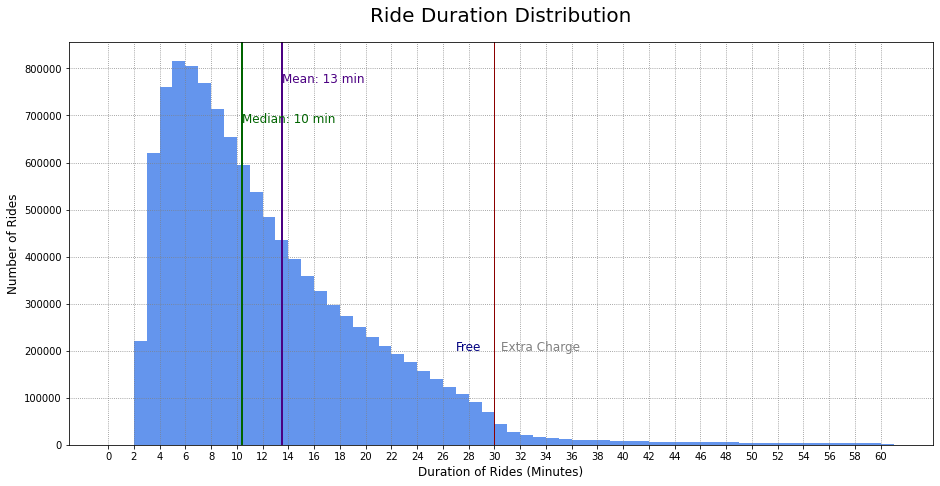

In [41]:
duration(df)

In [42]:
36831*100/11197148

0.3289319744634973

In [43]:
df[1800>df["duration"]].shape # Rides under 30 minutes (free trips)

(10803302, 17)

In [44]:
df[10000<df["distance"]].shape # Trips where distance was over 10km 

(36830, 17)

In [45]:
df[10000>df["distance"]].shape # Trips where distance was under 10km 

(11160313, 17)

In [46]:
df.shape

(11197148, 17)

In [47]:
10803303/11197149 # Calculated the % of free trips 

0.9648262249613718

In [48]:
print("Total hours spent on service: %.2f" % (sum(df['duration'])/3600))
print("which account to over 287 years!")
print(("Total km with service: %.2f" % (sum(df['distance'])/1000)))
print("this distance is over 85 light seconds, which is over half the average distance between Earth and Venus ")
# The avg distance is 25million miles or 40mil kms. (Googled 25m km)

Total hours spent on service: 2516832.68
which account to over 287 years!
Total km with service: 25739965.12
this distance is over 85 light seconds, which is over half the average distance between Earth and Venus 


In [49]:
# This function plots the distance distribution for our dataframe. This will be used both to explore the average ride lengths
# and later on in the project.
# This function was originally taken from Kaggle and changed to fit our needs.

def distance(dataframe, xlim_min=0, xlim_max=15000):
    
    df = dataframe.copy()
    
    fig = plt.figure(figsize=(15,7))
    ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

    data = df["distance"]
    plt.hist(data, bins = 60, color = "cornflowerblue")

    plt.axvline(data.mean(), color="indigo", linestyle='-', linewidth=2 )
    plt.axvline(data.median(), color="darkgreen", linestyle='-', linewidth=2 )
    plt.axvline(data.median(), color="darkgreen", linestyle='-', linewidth=2 )

    min_ylim, max_ylim = plt.ylim()

    plt.text(data.mean()*1.0, max_ylim*0.9, 'Mean: {:.0f} m'.format(data.mean()), color = "indigo",  fontsize= 10)
    plt.text(data.median()*1.0, max_ylim*0.8, 'Median: {:.0f} m'.format(data.median()), color = "darkgreen", fontsize= 10)

    ax.set_xlim([xlim_min,xlim_max])

    # Labeling Axes
    plt.xlabel("Travelled Distance (meters)", fontsize= 15, x = 0.5)
    plt.ylabel("Number of Rides (millions)", fontsize= 15)

    # Adding Grid
    plt.grid(linestyle=":", color='grey')

    plt.show()


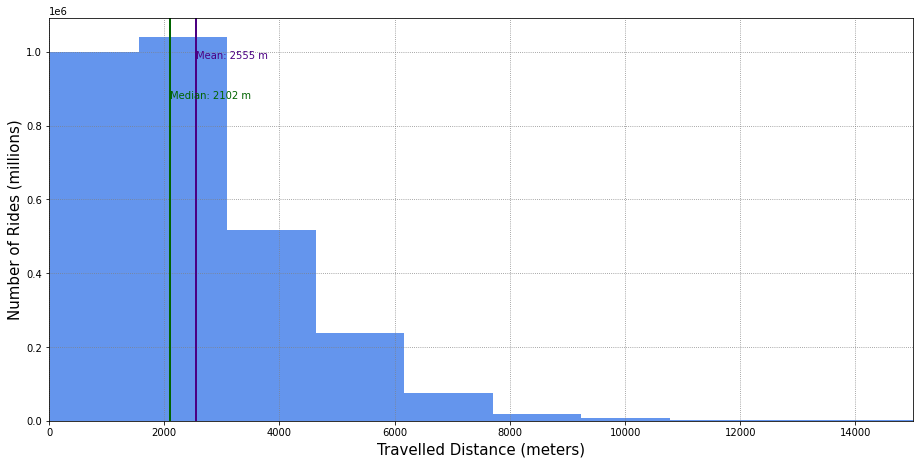

In [50]:
distance(df20)

In [51]:
# This function Calculates the precentage of size of a subset of a df compared to the original df.
def percentage(df_full, partial_df):
    nride_partial, features = partial_df.shape
    nride_full, features = df_full.shape
    return (nride_partial*100/nride_full)

In [52]:
df.distance.describe()
nride1, features = df[df.distance >= 5000].shape
nride2, features = df.shape
print("Rides over 5km during the years %.2f%%" % (nride1*100/nride2))
print("Rides over 5km during 2018 %.2f%%" % percentage(df18, df18[df18.distance >= 5000]))
print("Rides over 5km during 2019 %.2f%%" % percentage(df19, df19[df19.distance >= 5000]))
print("Rides over 5km during 2020 %.2f%%" % percentage(df20, df20[df20.distance >= 5000]))

Rides over 5km during the years 6.54%
Rides over 5km during 2018 5.44%
Rides over 5km during 2019 6.27%
Rides over 5km during 2020 9.32%


We can see the service is being more used for longer trips as the time progresses.

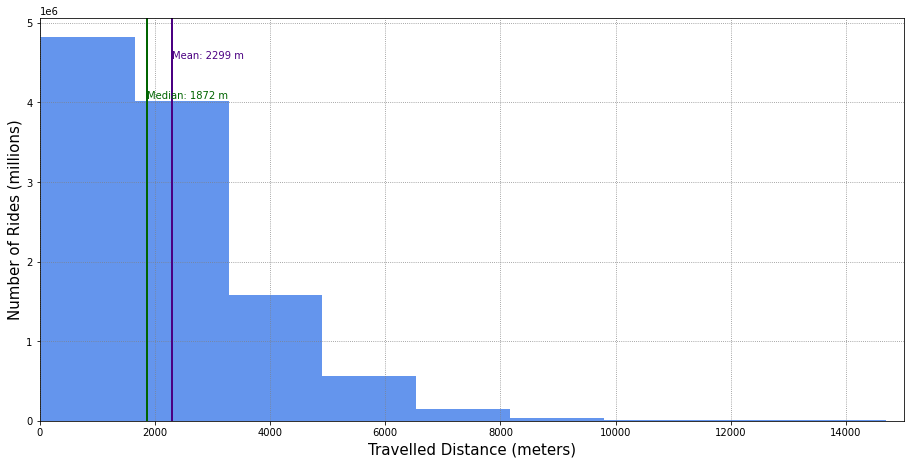

In [53]:
distance(df)

### Exploring Paid Trips - Trips over 30 minutes, and that intended to be

In [54]:
paid_trips = df[1800<df["duration"]].copy() # As of 2020 paid trips consist of almost 10% of the rides, we'll explore paid trips more:

In [55]:
paid_trips.distance.describe()

count   392892.00
mean      5429.87
std       3660.30
min         21.00
25%       2893.00
50%       4896.00
75%       7012.00
max      97833.33
Name: distance, dtype: float64

In [56]:
# Removing some outliers from the paid trips 
paid = paid_trips[paid_trips["avg_speed"]>0]
paid = paid[(32*60)<paid["duration"]] 
paid = paid[paid["distance"]>500]
# paid[['distance','duration','avg_speed']].describe()

print("after removing trips that we suspect are not intended to be over the 30 minutes mark,", 
      "paid trips in 2020 compose %.2f%% of the total paid trips." % percentage(paid, paid[paid['depart_year']==2020]))
paid[paid['depart_year']==2020][['distance','duration','avg_speed']].describe()


after removing trips that we suspect are not intended to be over the 30 minutes mark, paid trips in 2020 compose 26.21% of the total paid trips.


,distance,duration,avg_speed
count,83617.00,83617.00,83617.00
mean,6229.48,3795.86,0.12
std,3924.15,2657.59,0.07
min,502.00,1921.00,0.00
25%,3446.00,2202.00,0.06
50%,5768.00,2761.00,0.12
75%,8047.00,4155.00,0.18
max,92175.00,17998.00,0.50


trips with duration over 2.5 hours compose 8.91%
trips with duration over 2.5 hours in 2020 compose 5.91%


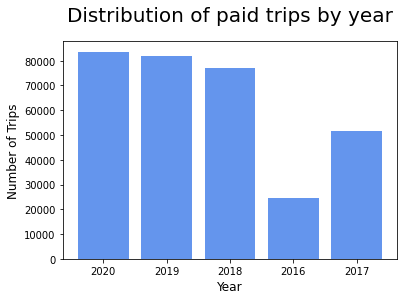

In [57]:
paid20 = paid[paid['depart_year']==2020]
print("trips with duration over 2.5 hours compose %.2f%%" % percentage(paid, paid[paid['duration']>9000]))
print("trips with duration over 2.5 hours in 2020 compose %.2f%%" % percentage(paid20, paid20[paid20['duration']>9000]))
Counter(paid.depart_year) # Shows the number of times a trip ended for each station.
labels, values = zip(*Counter(paid.depart_year).items())

indexes = np.arange(len(labels))
width = 0.8

plt.bar(indexes, values, width, color='cornflowerblue')
plt.xticks(indexes , labels)

# ax.set_title('Distribution of paid trips by year', fontdict={"fontsize":20}, pad = 20)
plt.title(label='Distribution of paid trips by year', fontdict={"fontsize":20}, pad = 20)
plt.xlabel("Year", fontsize= 12, x = 0.5)
plt.ylabel("Number of Trips", fontsize= 12)
plt.show()

We can compare the distribution of paid trips and see it is similiar to that of total trips. However we can also see that the number of yearly paid trips increases slightly every year.

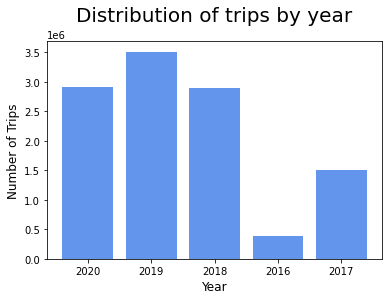

In [58]:
labels, values = zip(*Counter(df.depart_year).items())

indexes = np.arange(len(labels))
width = 0.8

plt.bar(np.sort(indexes), values, width, color='cornflowerblue')
plt.xticks(indexes , labels)

# ax.set_title('Distribution of paid trips by year', fontdict={"fontsize":20}, pad = 20)
plt.title(label='Distribution of trips by year', fontdict={"fontsize":20}, pad = 20)
plt.xlabel("Year", fontsize= 12, x = 0.5)
plt.ylabel("Number of Trips", fontsize= 12)
plt.show()

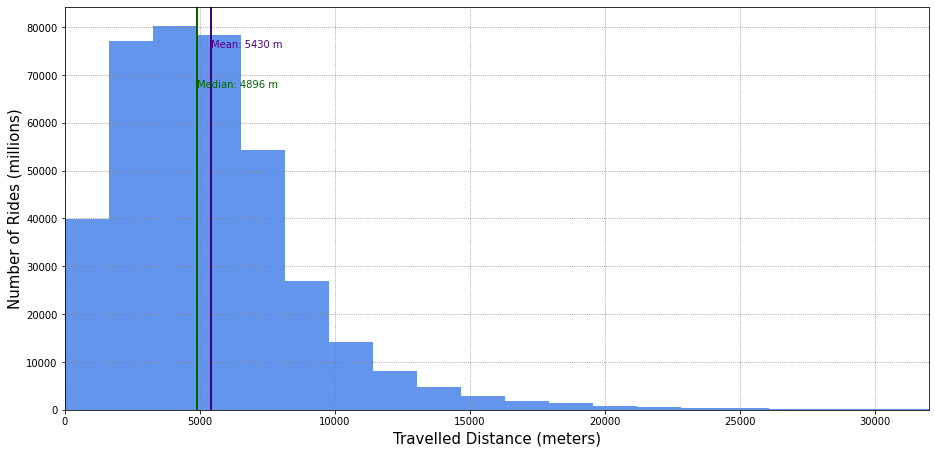

In [59]:
distance(paid_trips, xlim_max=32000)

In [60]:
# This function plots the duration distribution for our dataaframe. This will be used both to explore the average ride durations
# and later on in the project
# This function was taken from Kaggle and changed to fit our needs.
# This version of the function is better for the longer rides

def duration2(dataframe, xticks=range(30, 330, 30), n_bins=300):
    
    df = dataframe.copy()
    
    # Converting seconds to minutes
    df["duration"] = df["duration"]/60
    
    # Filtering relevant data
    duration_data = df["duration"]
    fig = plt.figure(figsize=(15,7))
    ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

    # Ploting the histogram
    plt.hist(duration_data, bins = range(n_bins), color = "cornflowerblue", histtype ="bar")

    # Adding median and mean lines
    plt.axvline(duration_data.mean(), color="indigo", linestyle='-', linewidth=2 )
    plt.axvline(duration_data.median(), color="darkgreen", linestyle='-', linewidth=2 )
    plt.axvline(x = 30, color="darkred", linestyle='-', linewidth=1 )

    # Adding median and mean texts
    min_ylim, max_ylim = plt.ylim()
    plt.text(duration_data.mean()*1, max_ylim*0.9, 'Mean: {:.0f} min'.format(duration_data.mean()), color = "indigo",  fontsize= 12)
    plt.text(duration_data.median()*1, max_ylim*0.8, 'Median: {:.0f} min'.format(duration_data.median()), color = "darkgreen", fontsize= 12)
    plt.text(x= 18,y=30000, s="Free", color = "navy", fontsize= 12)
    plt.text(x= 32,y=30000, s="Extra Charge", color = "grey", fontsize= 12)

    # Seting ticks on x axis
    ticks =xticks
    plt.xticks(ticks)
    # Seting ticks on y axis
    ticks =range(0, 3600, 2000)

    # Labeling Axes
    ax.set_title('Ride Duration Distribution', fontdict={"fontsize":20}, pad = 20)
    plt.xlabel("Duration of Rides (Minutes)", fontsize= 12, x = 0.5)
    plt.ylabel("Number of Rides", fontsize= 12)

    # Adding Grid
    plt.grid(linestyle=":", color='grey')

    plt.show()



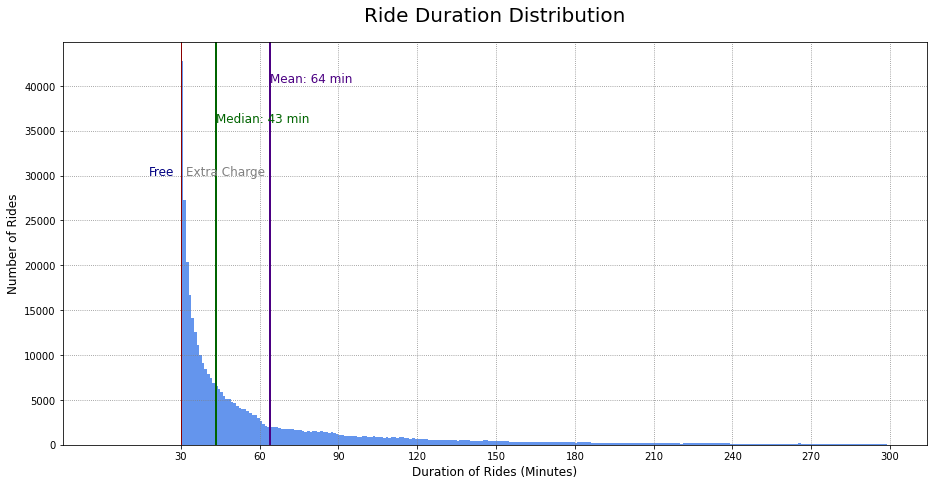

In [61]:
duration2(paid_trips, xticks=range(30, 330, 30), n_bins=300)

In [62]:
def common_ride(dataframe):
    route = dataframe["departure_name"] + ' -to- ' + dataframe["return_name"]
    return Counter(route)

In [63]:
common_ride(df).most_common(10)

[('Aalto-yliopisto (M), Korkeakouluaukio -to- Jämeräntaival', 33590),
 ('Jämeräntaival -to- Aalto-yliopisto (M), Korkeakouluaukio', 33318),
 ('Itämerentori -to- Tyynenmerenkatu', 19504),
 ('Tyynenmerenkatu -to- Itämerentori', 18368),
 ('Töölönlahdenkatu -to- Baana', 16738),
 ('Itämerentori -to- Salmisaarenranta', 16280),
 ('Itämerentori -to- Töölönlahdenkatu', 16138),
 ('Töölönlahdenkatu -to- Itämerentori', 16030),
 ('Baana -to- Töölönlahdenkatu', 15970),
 ('Itämerentori -to- Itämerentori', 15844)]

In [64]:
for (route, num) in common_ride(df).most_common(10):
    print(route)

Aalto-yliopisto (M), Korkeakouluaukio -to- Jämeräntaival
Jämeräntaival -to- Aalto-yliopisto (M), Korkeakouluaukio
Itämerentori -to- Tyynenmerenkatu
Tyynenmerenkatu -to- Itämerentori
Töölönlahdenkatu -to- Baana
Itämerentori -to- Salmisaarenranta
Itämerentori -to- Töölönlahdenkatu
Töölönlahdenkatu -to- Itämerentori
Baana -to- Töölönlahdenkatu
Itämerentori -to- Itämerentori


## Network Visualisation and Analysis

In [65]:
common_ride(df20).most_common(10)

[('Aalto-yliopisto (M), Korkeakouluaukio -to- Jämeräntaival', 11501),
 ('Jämeräntaival -to- Aalto-yliopisto (M), Korkeakouluaukio', 11398),
 ('Leppävaaranaukio -to- Kirjurinkuja', 4925),
 ('Kirjurinkuja -to- Leppävaaranaukio', 4853),
 ('Haukilahdenkatu -to- Kalasatama (M)', 3713),
 ('Kalasatama (M) -to- Haukilahdenkatu', 3696),
 ('Itämerentori -to- Tyynenmerenkatu', 3286),
 ('Tyynenmerenkatu -to- Itämerentori', 3184),
 ('Itämerentori -to- Länsisatamankuja', 3040),
 ('Länsisatamankuja -to- Itämerentori', 3012)]

Text(0.5, 1.0, 'Network Visualization')

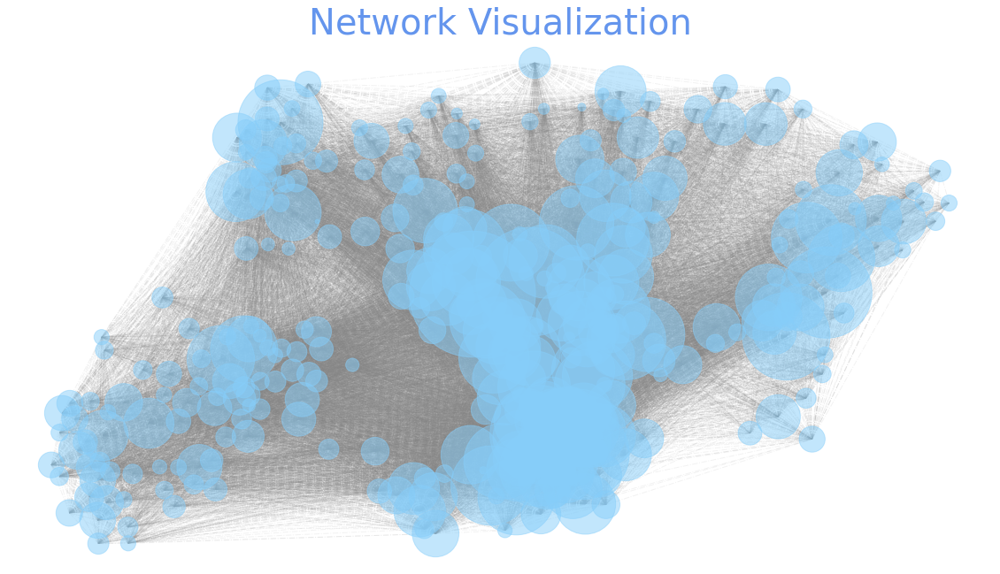

In [66]:
#Printing a network graph for all year 
G = nx.Graph()
G = nx.from_pandas_edgelist(df, 'departure_name', 'return_name', edge_attr=['duration','distance'])

fig, ax = plt.subplots(figsize=(20,11))
stantions  = pd.read_csv("station_coordinates.csv")
stantions.set_index('name',inplace=True)
stantions["pos"] = list(zip(stantions["longitude"].astype(float), stantions["latitude"].astype(float)))
pos = stantions.to_dict()['pos']

for node, position in pos.items():
    try:
        G.nodes[node]['pos'] = position
    except KeyError:
        pass

nx.draw_networkx_nodes(G=G,pos=G.nodes.data('pos'), node_color = 'lightskyblue', alpha=0.5, node_size= (df['departure_name'].value_counts()/15).tolist())
nx.draw_networkx_edges(G=G,pos=G.nodes.data('pos'), edge_color='grey', style ='dashdot', alpha=0.1, arrows=False)
ax.axis('off')
ax.set_title('Network Visualization',color='cornflowerblue', size = 40)

In [67]:
def max_degree(G):
    return sorted(G.degree, key=lambda x: x[1], reverse=True)[0]

print("#############################################")
print(nx.info(G))
# print('Nodes:', G.number_of_nodes)
# print('Edges:', G.number_of_edges)
# print('Max Degree: (Stations, Degree) = ', max_degree(G))
print("#############################################")



#############################################
Name: 
Type: Graph
Number of nodes: 347
Number of edges: 36287
Average degree: 209.1470
#############################################


Text(0.5, 1.0, '2020')

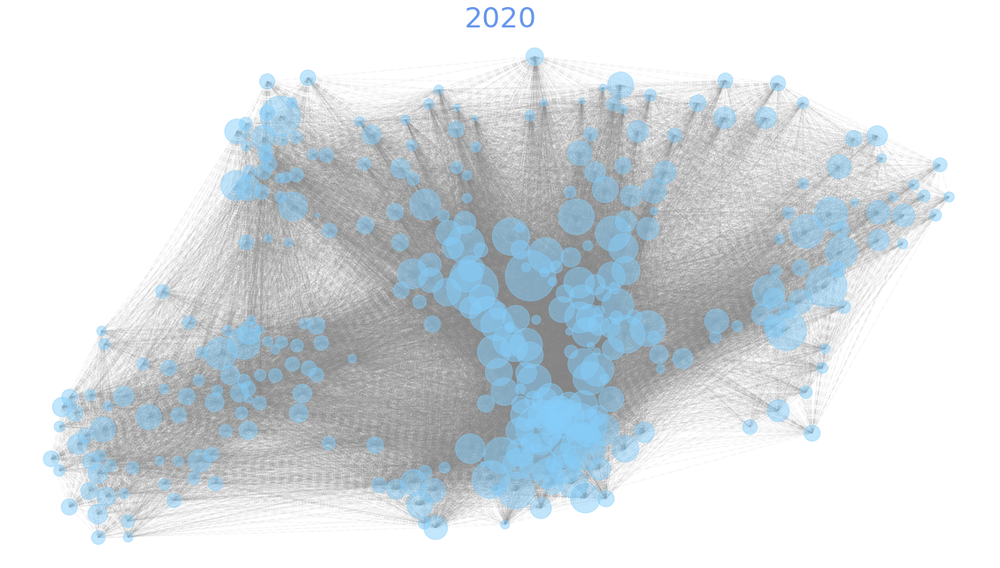

In [68]:
#Printing a network graph for one year 
#This function was originally taken from Kaggle and changed to fit our needs.
df2020 = df[df['departure'].dt.year == 2020]
    
G2020 = nx.Graph()
G2020 = nx.from_pandas_edgelist(df2020, 'departure_name', 'return_name', edge_attr=['duration','distance'])

fig, ax = plt.subplots(figsize=(20,11))

stantions  = pd.read_csv("station_coordinates.csv")
stantions.set_index('name',inplace=True)
stantions["pos"] = list(zip(stantions["longitude"].astype(float), stantions["latitude"].astype(float)))
pos = stantions.to_dict()['pos']

for node, position in pos.items():
    try:
        G2020.nodes[node]['pos'] = position
    except KeyError:
        pass

nx.draw_networkx_nodes(G=G2020,pos=G2020.nodes.data('pos'), node_color = 'lightskyblue', alpha=0.5, node_size= (df2020['departure_name'].value_counts()/15).tolist())
nx.draw_networkx_edges(G=G2020,pos=G2020.nodes.data('pos'), edge_color='grey', style ='dashdot', alpha=0.1, arrows=False)
ax.axis('off')
ax.set_title('2020',color='cornflowerblue',size = 32)    


Text(0.5, 1.0, '2019')

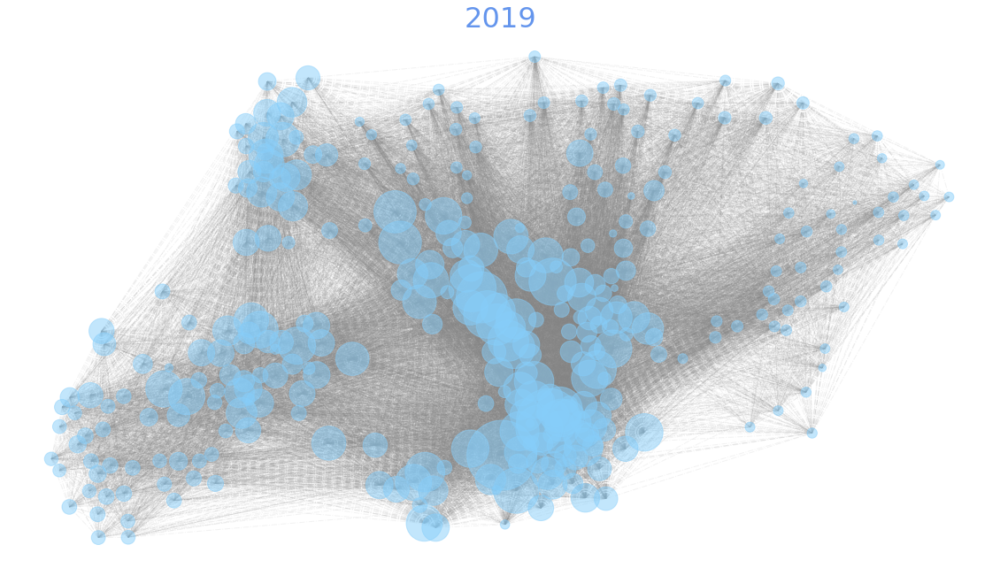

In [69]:
#Printing a network graph for one year 
df2019 = df[df['departure'].dt.year == 2019]
G2019 = nx.Graph()
G2019 = nx.from_pandas_edgelist(df2019, 'departure_name', 'return_name', edge_attr=['duration','distance'])

fig, ax = plt.subplots(figsize=(20,11))

stantions  = pd.read_csv("station_coordinates.csv")
stantions.set_index('name',inplace=True)
stantions["pos"] = list(zip(stantions["longitude"].astype(float), stantions["latitude"].astype(float)))
pos = stantions.to_dict()['pos']


for node, position in pos.items():
    try:
        G2019.nodes[node]['pos'] = position
    except KeyError:
        pass

nx.draw_networkx_nodes(G=G2019,pos=G2019.nodes.data('pos'), node_color = 'lightskyblue', alpha=0.5, node_size= (df2019['departure_name'].value_counts()/15).tolist())
nx.draw_networkx_edges(G=G2019,pos=G2019.nodes.data('pos'), edge_color='grey', style ='dashdot', alpha=0.1, arrows=False)
ax.axis('off')
ax.set_title('2019',color='cornflowerblue', size = 32)


Text(0.5, 1.0, '2018')

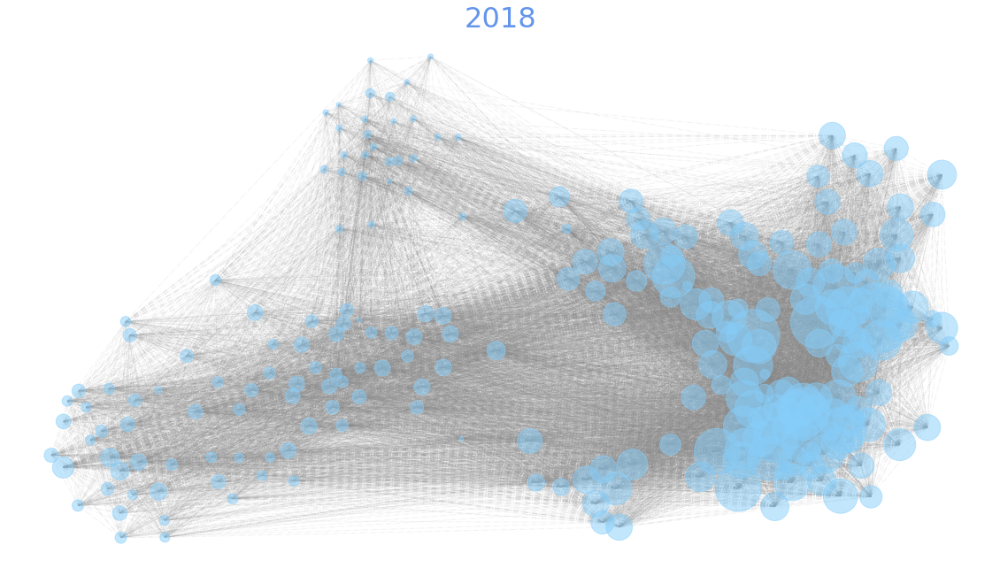

In [70]:
#Printing a network graph for one year 
df2018 = df[df['departure'].dt.year == 2018]

G2018 = nx.Graph()
G2018 = nx.from_pandas_edgelist(df2018, 'departure_name', 'return_name', edge_attr=['duration','distance'])

fig, ax = plt.subplots(figsize=(20,11))

stantions  = pd.read_csv("station_coordinates.csv")
stantions.set_index('name',inplace=True)
stantions["pos"] = list(zip(stantions["longitude"].astype(float), stantions["latitude"].astype(float)))
pos = stantions.to_dict()['pos']

for node, position in pos.items():
    try:
        G2018.nodes[node]['pos'] = position
    except KeyError:
        pass

nx.draw_networkx_nodes(G=G2018,pos=G2018.nodes.data('pos'), node_color = 'lightskyblue', alpha=0.5, node_size= (df2018['departure_name'].value_counts()/15).tolist())
nx.draw_networkx_edges(G=G2018,pos=G2018.nodes.data('pos'), edge_color='grey', style ='dashdot', alpha=0.1, arrows=False)
ax.axis('off')
ax.set_title('2018', color='cornflowerblue',size = 32)


Text(0.5, 1.0, '2017')

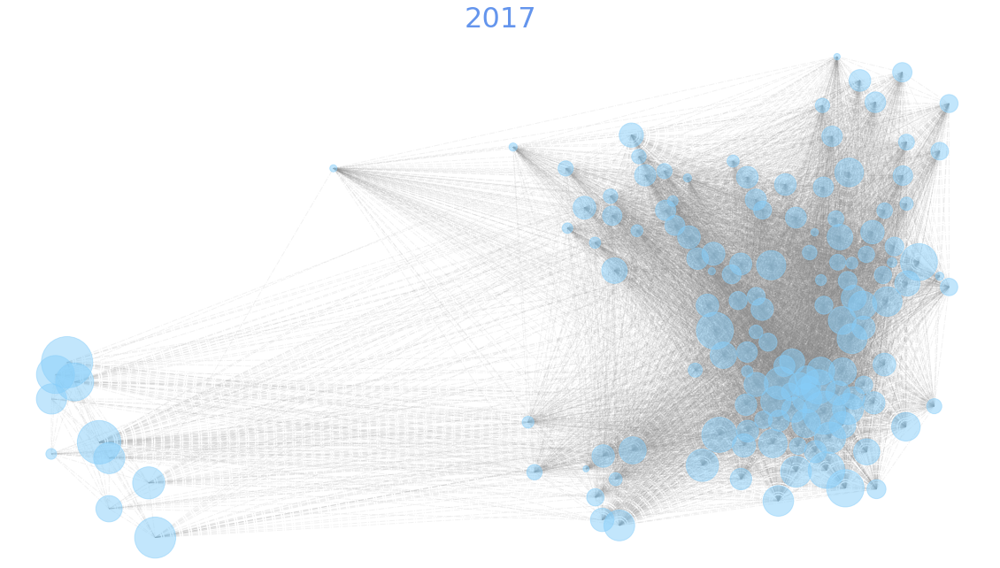

In [71]:
#Printing a network graph for one year 
df2017 = df[df['departure'].dt.year == 2017]

G2017 = nx.Graph()
G2017 = nx.from_pandas_edgelist(df2017, 'departure_name', 'return_name', edge_attr=['duration','distance'])

fig, ax = plt.subplots(figsize=(20,11))

stantions  = pd.read_csv("station_coordinates.csv")
stantions.set_index('name',inplace=True)
stantions["pos"] = list(zip(stantions["longitude"].astype(float), stantions["latitude"].astype(float)))
pos = stantions.to_dict()['pos']

for node, position in pos.items():
    try:
        G2017.nodes[node]['pos'] = position
    except KeyError:
        pass

nx.draw_networkx_nodes(G=G2017,pos=G2017.nodes.data('pos'), node_color = 'lightskyblue', alpha=0.5, node_size= (df2017['departure_name'].value_counts()/15).tolist())
nx.draw_networkx_edges(G=G2017,pos=G2017.nodes.data('pos'), edge_color='grey', style ='dashdot', alpha=0.1, arrows=False)
ax.axis('off')
ax.set_title('2017',color='cornflowerblue', size = 32)

Text(0.5, 1.0, '2016')

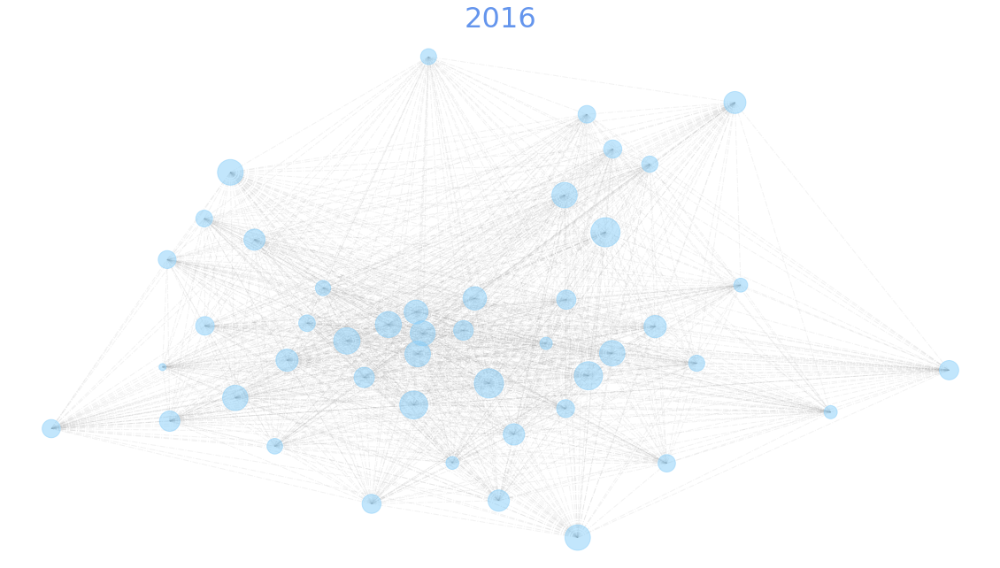

In [72]:
#Printing a network graph for one year 
df2016 = df[df['departure'].dt.year == 2016]

G2016 = nx.Graph()
G2016 = nx.from_pandas_edgelist(df2016, 'departure_name', 'return_name', edge_attr=['duration','distance'])

fig, ax = plt.subplots(figsize=(20,11))

stantions  = pd.read_csv("station_coordinates.csv")
stantions.set_index('name',inplace=True)
stantions["pos"] = list(zip(stantions["longitude"].astype(float), stantions["latitude"].astype(float)))
pos = stantions.to_dict()['pos']

for node, position in pos.items():
    try:
        G2016.nodes[node]['pos'] = position
    except KeyError:
        pass

nx.draw_networkx_nodes(G=G2016,pos=G2016.nodes.data('pos'), node_color = 'lightskyblue', alpha=0.5, node_size= (df2016['departure_name'].value_counts()/15).tolist())
nx.draw_networkx_edges(G=G2016,pos=G2016.nodes.data('pos'), edge_color='grey', style ='dashdot', alpha=0.1, arrows=False)
ax.axis('off')
ax.set_title('2016',color='cornflowerblue', size = 32)

In [73]:
#Building a function printing intersting stats about our network
def Nstats(G):
    
    print(nx.info(G))

    deg = dict(G.degree(G.nodes()))
    nx.set_node_attributes(G, deg, 'degree')

    sorted_degree = sorted(deg.items(), key=itemgetter(1), reverse=True)
    print("\nTop 5 nodes by degree:\n")
    for d in sorted_degree[:5]:
        print(d)

    betweenness = nx.betweenness_centrality(G)
    eigenvector = nx.eigenvector_centrality(G) 

    print("\nNetwork density:", nx.density(G))

In [74]:
#Here we print intersting stats for each year and for all years together
print('For 2020')
Nstats(G2020)
print('\nFor 2019')
Nstats(G2019)
print('\nFor 2018')
Nstats(G2018)
print('\nFor 2017')
Nstats(G2017)

print('\nFor 2016')
Nstats(G2016)

print('\nFor all the years')
Nstats(G)

For 2020
Name: 
Type: Graph
Number of nodes: 347
Number of edges: 31679
Average degree: 182.5879

Top 5 nodes by degree:

('Haukilahdenkatu', 317)
('Paciuksenkaari', 282)
('Itämerentori', 280)
('Laajalahden aukio', 280)
('Huopalahdentie', 280)

Network density: 0.5277106828138795

For 2019
Name: 
Type: Graph
Number of nodes: 340
Number of edges: 29189
Average degree: 171.7000

Top 5 nodes by degree:

('Haukilahdenkatu', 310)
('Kaisaniemenpuisto', 278)
('Itämerentori', 269)
('Tilkanvierto', 265)
('Huopalahdentie', 265)

Network density: 0.5064896755162241

For 2018
Name: 
Type: Graph
Number of nodes: 246
Number of edges: 17985
Average degree: 146.2195

Top 5 nodes by degree:

('Itämerentori', 222)
('Laajalahden aukio', 219)
('Haukilahdenkatu', 216)
('Lauttasaaren ostoskeskus', 215)
('Lehtisaarentie', 215)

Network density: 0.5968143354902937

For 2017
Name: 
Type: Graph
Number of nodes: 142
Number of edges: 8788
Average degree: 123.7746

Top 5 nodes by degree:

('Itämerentori', 143)
('K

<AxesSubplot:xlabel='departure_longitude', ylabel='departure_latitude'>

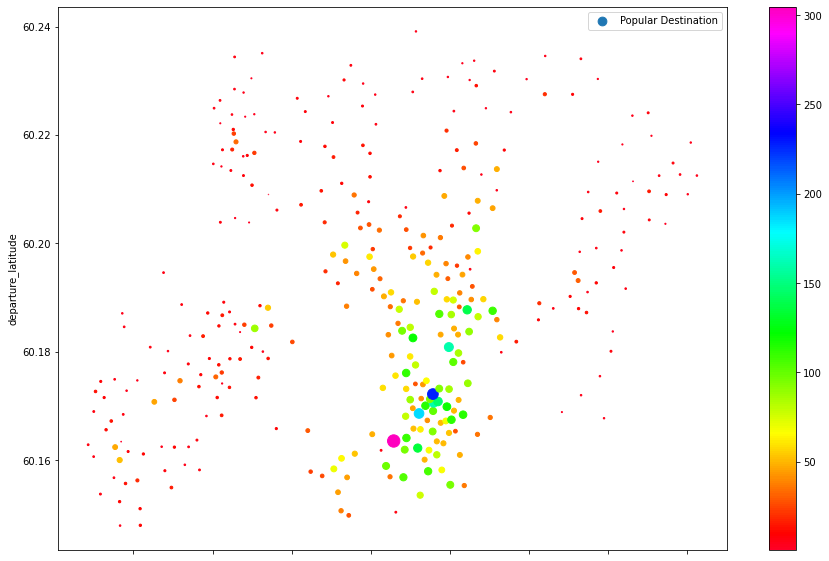

In [75]:
#Now let's plot the most popular station according to their location, 
#we can see 3 dots that are more significant than the others. 
# After we checked on google those are Itamerentori and Haukilahdenkatu. 
departure_stations = df[['departure','departure_latitude','departure_longitude']]
departure_stations = departure_stations.dropna()
counter = departure_stations.groupby(['departure_latitude','departure_longitude'])[['departure']].count()
counter.reset_index(inplace=True)
counter.plot(kind="scatter",x="departure_longitude",y="departure_latitude",
s=counter["departure"]/2000,
figsize=(15,10),label="Popular Destination",c=counter["departure"]/1000,
cmap=plt.get_cmap("gist_rainbow"),colorbar=True)

In [76]:
#This function will print our network by degree centrality allowing us to analyse it
# easier that we could have with only the network graph 
#This function was originally taken from Kaggle and changed to fit our needs.
def DCentrality(G,fig,ax):  

    deg = nx.degree_centrality(G)
    node_color = [deg[i] for i in deg.keys()]
    colors=range(35)
    cmap=plt.cm.plasma
    vmin = min(node_color)
    vmax = max(node_color)
    scalar = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin, vmax=vmax))
    scalar._A = []
    plt.colorbar(scalar)

    nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos') ,node_color=node_color,cmap="plasma", alpha=1, node_size= 50)
    nx.draw_networkx_edges(G=G, pos=G.nodes.data('pos') ,edge_color='grey', style ="dotted", alpha=0.1, arrows=False)


    ax.set_title('Degree Centrality - Helsinki City Bike Network ', pad = 15)
    ax.axis('off')

Degree centrality for all years


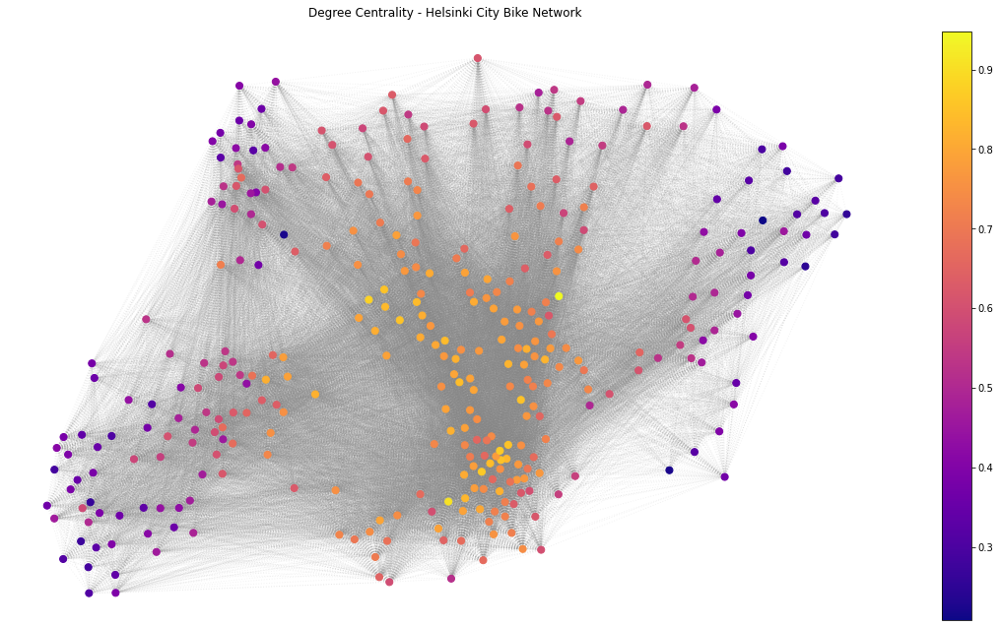

In [77]:
print('Degree centrality for all years')
fig, ax = plt.subplots(figsize=(20,11))
DCentrality(G,fig,ax)

Evolution of the degree_centrality graph by year from 2016 to 2018


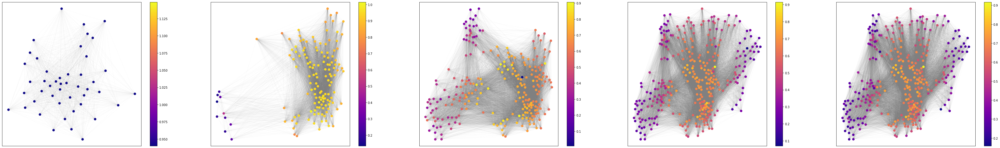

In [78]:
#Evolution of the degree_centrality graph by year from 2016 to 2018
print('Evolution of the degree_centrality graph by year from 2016 to 2018') 

fig = plt.figure(figsize =(60,30))
fig.add_subplot(3,5,1)
DCentrality(G2016,fig,ax)
fig.add_subplot(3,5,2)
DCentrality(G2017,fig,ax)
fig.add_subplot(3,5,3)
DCentrality(G2018,fig,ax)
fig.add_subplot(3,5,4)
DCentrality(G2019,fig,ax)
fig.add_subplot(3,5,5)
DCentrality(G2020,fig,ax)
plt.show()




In [79]:
#Function building Closeness centrality graph 
#This function was originally taken from Kaggle and changed to fit our needs.
def ClosenessCentrality(G,fig,ax):
   
    closeness = nx.closeness_centrality(G)
    node_color = [closeness[i] for i in closeness.keys()]

    colors=range(20)
    cmap=plt.cm.plasma
    vmin = min(node_color)
    vmax = max(node_color)
    scalar = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin, vmax=vmax))
    scalar._A = []
    plt.colorbar(scalar)
    nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos') ,node_color=node_color,cmap="plasma", alpha=1, node_size= 50)
    nx.draw_networkx_edges(G=G, pos=G.nodes.data('pos') ,edge_color='grey', style ="dotted", alpha=0.1, arrows=False)

    ax.set_title('Closeness Centrality', pad = 15)
    ax.axis('off')

Closeness centrality for all the years


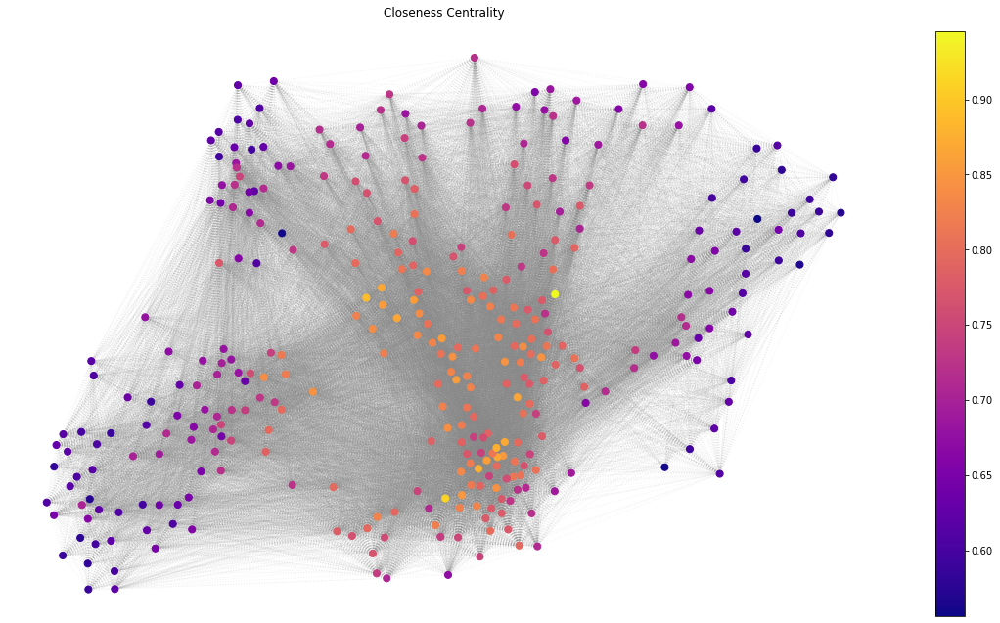

In [80]:
print('Closeness centrality for all the years')
fig, ax = plt.subplots(figsize=(20,11))
ClosenessCentrality(G,fig,ax)

Evolution of the closeness_centrality graph by year from 2016 to 2018


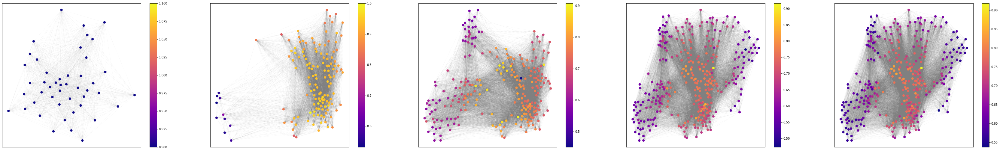

In [81]:
#Evolution of the closeness_centrality graph by year from 2016 to 2018
print('Evolution of the closeness_centrality graph by year from 2016 to 2018')
fig = plt.figure(figsize =(60,30))
fig.add_subplot(3,5,1)
ClosenessCentrality(G2016,fig,ax)
fig.add_subplot(3,5,2)
ClosenessCentrality(G2017,fig,ax)
fig.add_subplot(3,5,3)
ClosenessCentrality(G2018,fig,ax)
fig.add_subplot(3,5,4)
ClosenessCentrality(G2019,fig,ax)
fig.add_subplot(3,5,5)
ClosenessCentrality(G2020,fig,ax)
plt.show()

In [82]:
#Function building the graph with eigen value centrality mesure. 
#This function was originally taken from Kaggle and changed to fit our needs.
def EigenvCentrality(G,fig,ax):
 
    eigenvector = nx.eigenvector_centrality(G, max_iter=6000, weight="duration")
    node_color = [eigenvector[i] for i in eigenvector.keys()]
    colors=range(20)
    cmap=plt.cm.plasma
    vmin = min(node_color)
    vmax = max(node_color)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin = vmin, vmax=vmax))
    sm._A = []
    plt.colorbar(sm)

    nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos') ,node_color=node_color,cmap="plasma", alpha=1, node_size= 50)
    nx.draw_networkx_edges(G=G, pos=G.nodes.data('pos') ,edge_color='grey', style ="dotted", alpha=0.1, arrows=False)

    ax.set_title('Eigenvector Centrality - Helsinki City Bike Network', fontdict={"fontsize":20}, pad = 15)
    ax.axis('off')



Eigenvector centrality for all the years


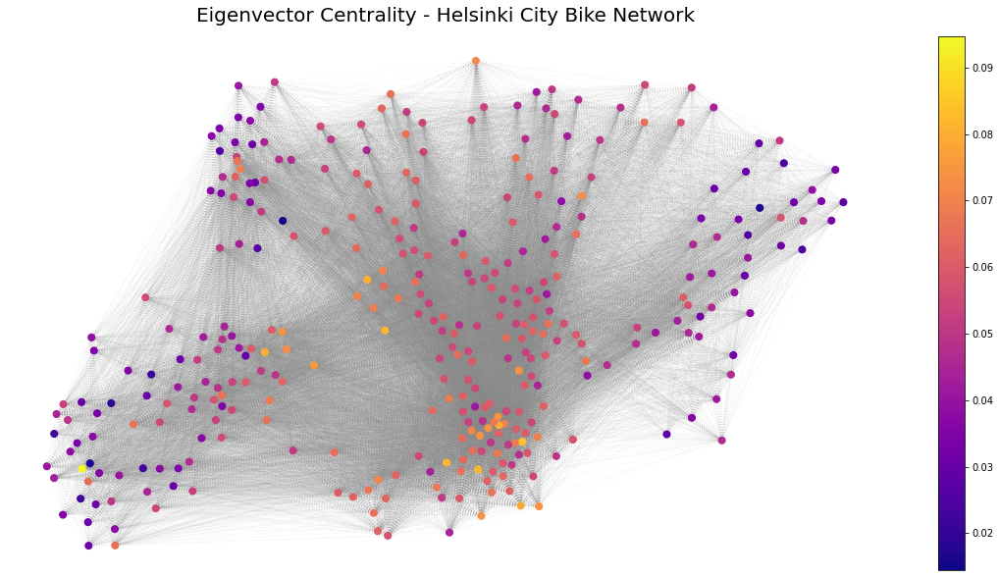

In [83]:
print('Eigenvector centrality for all the years')

fig, ax = plt.subplots(figsize=(20,10))
EigenvCentrality(G,fig,ax)

Evolution of the Eigenvector_centrality graph by year from 2016 to 2018


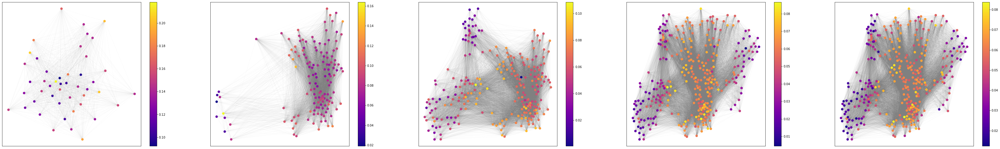

In [84]:
#Evolution of the Eigenvector_centrality graph by year from 2016 to 2018
print('Evolution of the Eigenvector_centrality graph by year from 2016 to 2018')
fig = plt.figure(figsize =(60,30))
fig.add_subplot(3,5,1)
EigenvCentrality(G2016,fig,ax)
fig.add_subplot(3,5,2)
EigenvCentrality(G2017,fig,ax)
fig.add_subplot(3,5,3)
EigenvCentrality(G2018,fig,ax)
fig.add_subplot(3,5,4)
EigenvCentrality(G2019,fig,ax)
fig.add_subplot(3,5,5)
EigenvCentrality(G2020,fig,ax)
plt.show()

In [85]:
#printing the top 5 nodes by eigenvector centrality 
eigenvector_centrality = nx.eigenvector_centrality(G2020)
top5 = sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True)
print('Top 5 nodes by eigenvector centrality')
top5[:5]

Top 5 nodes by eigenvector centrality


[('Haukilahdenkatu', 0.08020299781378662),
 ('Paciuksenkaari', 0.07663091442344117),
 ('Huopalahdentie', 0.0764357926420222),
 ('Laajalahden aukio', 0.0758488077952895),
 ('Töölöntulli', 0.0757955486224381)]

In [86]:
closenesscentrality = nx.closeness_centrality(G2020)
top5 = sorted(closenesscentrality.items(), key=lambda item: item[1], reverse=True)
print('Top 5 nodes by closeness centrality')
top5[:5]

Top 5 nodes by closeness centrality


[('Haukilahdenkatu', 0.9177718832891246),
 ('Paciuksenkaari', 0.8398058252427184),
 ('Itämerentori', 0.8357487922705314),
 ('Laajalahden aukio', 0.8357487922705314),
 ('Huopalahdentie', 0.8357487922705314)]

In [87]:
degree_centrality = nx.degree_centrality(G)
top5 = sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)
print('Top 5 nodes by degree centrality')
top5[:5]

Top 5 nodes by degree centrality


[('Haukilahdenkatu', 0.9479768786127167),
 ('Itämerentori', 0.907514450867052),
 ('Laajalahden aukio', 0.8815028901734103),
 ('Kamppi (M)', 0.8641618497109826),
 ('Töölönlahdenkatu', 0.8641618497109826)]

In [88]:
#Creating a variable with the name of the departure station
stations_name_2020 = list(df2020.departure_name.unique())
stations_name_2019 = list(df2019.departure_name.unique())
stations_name_2018 = list(df2018.departure_name.unique())
stations_name_2017 = list(df2017.departure_name.unique())
stations_name_2016 = list(df2016.departure_name.unique())

#Listing together stations that werent in the last year (new stations)
diff2020 = list(set(stations_name_2020) - set(stations_name_2019))
diff2019 = list(set(stations_name_2019) - set(stations_name_2018))
diff2018 = list(set(stations_name_2018) - set(stations_name_2017))
diff2017 = list(set(stations_name_2017) - set(stations_name_2016))


In [89]:
#Making top 5 nodes by degree for 2020 
degree_dict = dict(G2020.degree(G2020.nodes()))
nx.set_node_attributes(G2020, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
degdf = pd.DataFrame(sorted_degree)
degdf.drop(degdf.columns[len(degdf.columns)-1],axis=1,inplace=True)
degdf = degdf.head(5)
Edge_list_2020 = degdf.values.tolist()


In [90]:
#Making top 5 nodes by degree for 2019 
degree_dict = dict(G2019.degree(G2019.nodes()))
nx.set_node_attributes(G2019, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
degdf = pd.DataFrame(sorted_degree)
degdf.drop(degdf.columns[len(degdf.columns)-1],axis=1,inplace=True)
degdf = degdf.head(5)
Edge_list_2019 = degdf.values.tolist()

In [91]:
#Making top 5 nodes by degree for 2018
degree_dict = dict(G2018.degree(G2018.nodes()))
nx.set_node_attributes(G2018, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
degdf = pd.DataFrame(sorted_degree)
degdf.drop(degdf.columns[len(degdf.columns)-1],axis=1,inplace=True)
degdf = degdf.head(5)
Edge_list_2018 = degdf.values.tolist()

In [92]:
#Making top 5 nodes by degree for 2017
degree_dict = dict(G2017.degree(G2017.nodes()))
nx.set_node_attributes(G2017, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
degdf = pd.DataFrame(sorted_degree)
degdf.drop(degdf.columns[len(degdf.columns)-1],axis=1,inplace=True)
degdf = degdf.head(5)
Edge_list_2017 = degdf.values.tolist()

In [93]:
#Making top 5 nodes by degree for 2016
degree_dict = dict(G2016.degree(G2016.nodes()))
nx.set_node_attributes(G2016, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
degdf = pd.DataFrame(sorted_degree)
degdf.drop(degdf.columns[len(degdf.columns)-1],axis=1,inplace=True)
degdf = degdf.head(5)
Edge_list_2016 = degdf.values.tolist()

In [94]:
s = Edge_list_2020
common = [x for x in diff2020 if x in s]

In [95]:
def common_elements(list1, list2):
    result = []
    for element in list1:
        if element in list2:
            result.append(element)
    return result

In [96]:

print('Best stations that were both in 2020 and in 2019')

print(common_elements(Edge_list_2020,Edge_list_2019))

print('\nBest stations that were both in 2019 and in 2018')

print(common_elements(Edge_list_2018,Edge_list_2019))
print('\nBest stations that were both in 2018 and in 2017')

print(common_elements(Edge_list_2017,Edge_list_2018))
print('\nBest stations that were both in 2017 and in 2016')

print(common_elements(Edge_list_2017,Edge_list_2016))

Best stations that were both in 2020 and in 2019
[['Haukilahdenkatu'], ['Itämerentori'], ['Huopalahdentie']]

Best stations that were both in 2019 and in 2018
[['Itämerentori'], ['Haukilahdenkatu']]

Best stations that were both in 2018 and in 2017
[['Itämerentori']]

Best stations that were both in 2017 and in 2016
[['Erottajan aukio']]


In [97]:
#Calculating the top 5 max degree nodes 
def max_degree(G):
    sorteddegree = sorted(G.degree, key=lambda x: x[1], reverse=True)
    return sorteddegree[:5]

In [98]:
print('Degree for entire df:')
max_degree(G)

Degree for entire df:


[('Haukilahdenkatu', 328),
 ('Itämerentori', 314),
 ('Laajalahden aukio', 305),
 ('Kamppi (M)', 299),
 ('Töölönlahdenkatu', 299)]

In [99]:
print('degree for 2020')
max_degree(G2020)

degree for 2020


[('Haukilahdenkatu', 317),
 ('Paciuksenkaari', 282),
 ('Itämerentori', 280),
 ('Laajalahden aukio', 280),
 ('Huopalahdentie', 280)]

In [100]:
print('degree for 2019')
max_degree(G2019)

degree for 2019


[('Haukilahdenkatu', 310),
 ('Kaisaniemenpuisto', 278),
 ('Itämerentori', 269),
 ('Tilkanvierto', 265),
 ('Huopalahdentie', 265)]

In [101]:
print('degree for 2018')
max_degree(G2018)

degree for 2018


[('Itämerentori', 222),
 ('Laajalahden aukio', 219),
 ('Haukilahdenkatu', 216),
 ('Lauttasaaren ostoskeskus', 215),
 ('Lehtisaarentie', 215)]

In [102]:
print('degree for 2017')
max_degree(G2017)

degree for 2017


[('Itämerentori', 143),
 ('Kamppi (M)', 140),
 ('Töölönlahdenkatu', 138),
 ('Baana', 138),
 ('Erottajan aukio', 137)]

In [103]:
print('degree for 2016')
max_degree(G2016)

degree for 2016


[('Erottajan aukio', 47),
 ('Hakaniemi (M)', 47),
 ('Unioninkatu', 47),
 ('Vanha kirkkopuisto', 47),
 ('Narinkka', 47)]

In [104]:
def mapPlot(dataframe):
    #This function was originally taken from Kaggle and changed to fit our needs.

    # Data
    df = dataframe.copy()
    df['freq'] = df.groupby('departure_name')['departure_name'].transform('count')
    df["name"] = df["departure_name"]
    df = df[["name", "freq"]]
    df = df.drop_duplicates(subset=['name'])
    freq_dict = dict(zip(df.name, df.freq))

    df_stations = pd.read_csv("station_coordinates.csv", index_col=False)
    df_stations['freq']= df_stations['name'].map(freq_dict)
    df_stations["freq_adj"] = df_stations['freq']/(df_stations['freq'].median()/3)
    df_stations.fillna(1, inplace=True)
    df_stations.dropna(inplace=True)

    # Map
    hel_map = folium.Map([60.1975594, 24.9320720], zoom_start=12)
    folium.TileLayer('OpenStreetMap').add_to(hel_map)

    for index, row in df_stations.iterrows():
        folium.CircleMarker([row['latitude'],row['longitude']],
                        radius=row["freq_adj"],
                        popup=row['freq'],
                        color="#000080", 
                        fill_color="#3333ff", 
                    ).add_to(hel_map)

    display(hel_map)

In [105]:
print("Total number of nodes:", G.number_of_nodes())
print("Total number of edges:", G.number_of_edges())
# G.number_of_nodes()

Total number of nodes: 347
Total number of edges: 36287


In [106]:
import folium
mapPlot(df)

### Paid Trips and Sports

In [108]:
paid[['distance', 'duration', 'avg_speed']].describe()

,distance,duration,avg_speed
count,318981.00,318981.00,318981.00
mean,5628.44,4249.78,0.10
std,3892.28,3090.37,0.07
min,501.00,1921.00,0.00
25%,2875.00,2253.00,0.05
50%,4937.00,2967.00,0.09
75%,7345.00,4945.00,0.15
max,97833.33,17999.00,2.11


In [109]:
common_ride(paid).most_common(10)

[('Itämerentori -to- Itämerentori', 1200),
 ('Unioninkatu -to- Unioninkatu', 1087),
 ('Kaivopuisto -to- Kaivopuisto', 870),
 ('Hietalahdentori -to- Hietalahdentori', 790),
 ('Apollonkatu -to- Apollonkatu', 673),
 ('Liisanpuistikko -to- Liisanpuistikko', 635),
 ('Länsisatamankatu -to- Länsisatamankatu', 627),
 ('Sörnäinen (M) -to- Sörnäinen (M)', 606),
 ('Hakaniemi (M) -to- Hakaniemi (M)', 605),
 ('Isoisänsilta -to- Isoisänsilta', 577)]

In [110]:
# paid.to_csv("paid_rides.csv")